In [86]:
import os
import pandas as pd
import numpy as np
import tensorflow as tf
from pathlib import Path
import matplotlib.pyplot as plt
import time 
from sklearn.utils import class_weight as cw
from keras.models import load_model
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image
from keras import models
import seaborn as sns
import matplotlib.image as mpimg
import scipy.stats as ss

from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization
from keras.layers import Flatten, Dense, Dropout

# Import des librairies pour la gestion des Callback
from keras.callbacks import Callback, ReduceLROnPlateau, EarlyStopping


from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.model_selection import KFold
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split

from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix

from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import mean_squared_error,explained_variance_score, mean_absolute_percentage_error

from sklearn.linear_model import ElasticNetCV, LassoCV, RidgeCV
from sklearn.linear_model import ElasticNet, Lasso, Ridge
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR

In [2]:
y_train=pd.read_csv('y_train.csv') # y_train
y_random=pd.read_csv('y_random.csv') # exemple de y_pred à soumettre
y_train

,id_annonce,price
0,35996577,355000.0
1,35811033,190000.0
2,35731841,39000.0
3,35886765,299000.0
4,35781137,478000.0
...,...,...
37363,35881571,190000.0
37364,35890109,399000.0
37365,36010245,328000.0
37366,35864579,463000.0


In [3]:
data=pd.read_csv('data_final.csv')
data=data.iloc[:,1:]
data

,id_annonce,property_type,approximate_latitude,approximate_longitude,city,postal_code,size,floor,land_size,energy_performance_value,...,Min_ecole,nb_ecole_1kms,nb_ecole_3kms,nb_ecole_5kms,nb_ecole_10kms,nb_ecole_20kms,company_city_count,land_size_correct,size_correct,price_log
0,35996577,appartement,43.643880,7.117183,villeneuve-loubet,6270,63.0,NaN,NaN,NaN,...,1.049957,0,17,53,227,653,408.0,NaN,63.0,12.779876
1,35811033,appartement,45.695757,4.895610,venissieux,69200,90.0,3.0,NaN,223.0,...,0.180002,11,56,153,644,1155,517.0,NaN,90.0,12.154785
2,35731841,maison,47.966791,-1.220451,moutiers,35130,61.0,NaN,370.0,NaN,...,0.667630,1,3,10,17,97,145.0,370.0,61.0,10.571343
3,35886765,maison,47.289292,-1.878805,cordemais,44360,142.0,NaN,764.0,217.0,...,0.120038,2,2,5,28,142,257.0,764.0,142.0,12.608202
4,35781137,appartement,45.718992,4.844234,lyon-7eme,69007,88.0,3.0,NaN,NaN,...,0.980819,1,107,329,807,1141,1275.0,NaN,88.0,13.077368
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37345,35881571,appartement,43.480292,-1.484324,bayonne,64100,2995.0,NaN,NaN,255.0,...,0.189290,12,57,94,146,241,844.0,NaN,2995.0,12.154785
37346,35890109,appartement,48.861391,2.401158,paris-20eme,75020,36.0,4.0,NaN,229.0,...,0.230631,53,500,962,2802,5716,2887.0,NaN,36.0,12.896719
37347,36010245,appartement,44.397837,-1.164312,biscarrosse,40600,99.0,2.0,NaN,NaN,...,0.176353,4,7,7,15,24,137.0,NaN,99.0,12.700772
37348,35864579,duplex,48.864204,2.808693,magny-le-hongre,77700,9281.0,NaN,NaN,NaN,...,0.169916,5,30,58,160,804,158.0,NaN,9281.0,13.045484


In [ ]:
df=data.set_index('id_annonce')

Pour l'annonce N° 35996577



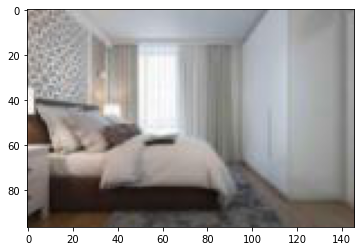

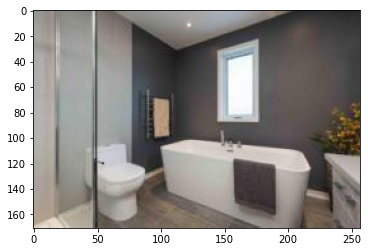

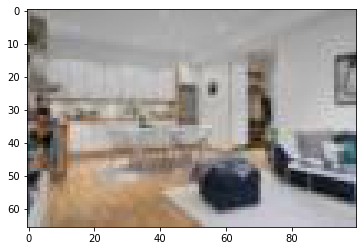

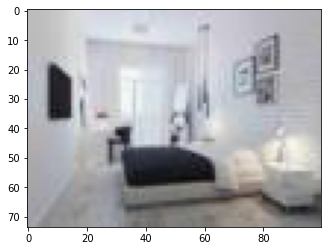

###########################################################################

Pour l'annonce N° 35811033



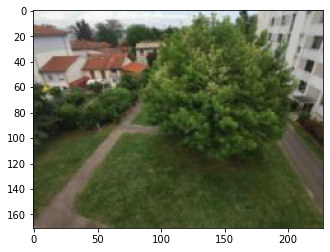

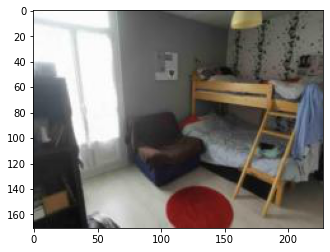

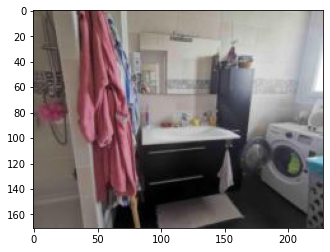

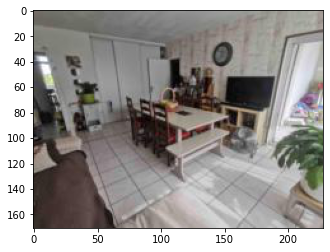

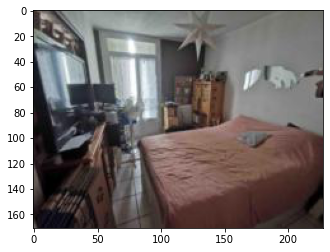

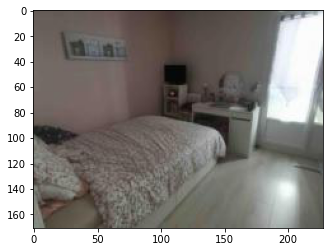

###########################################################################

Pour l'annonce N° 35731841



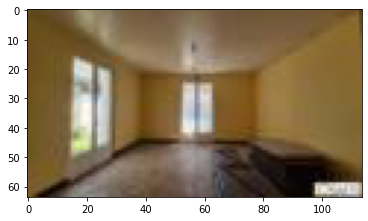

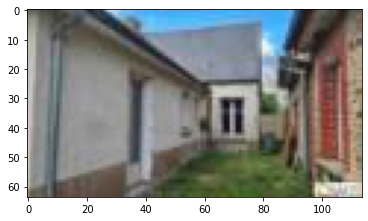

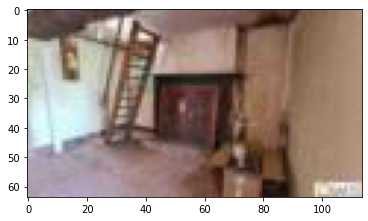

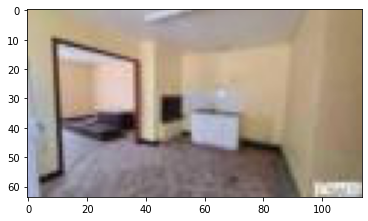

###########################################################################

Pour l'annonce N° 35886765



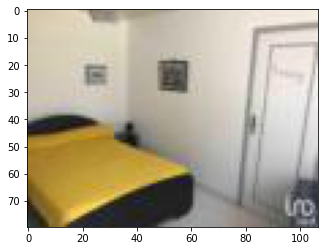

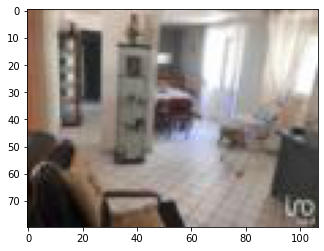

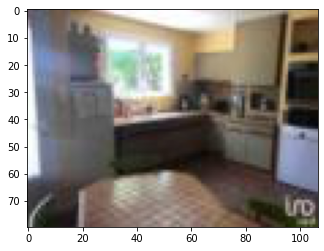

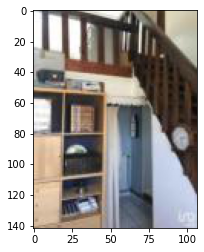

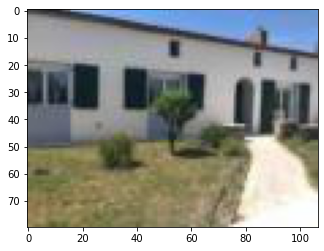

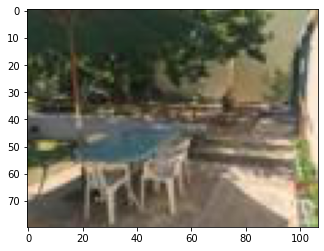

###########################################################################

Pour l'annonce N° 35781137



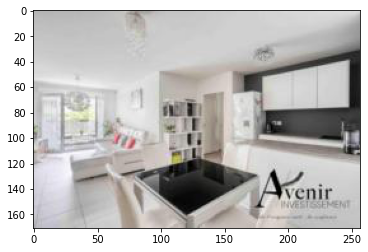

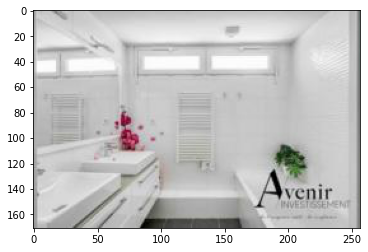

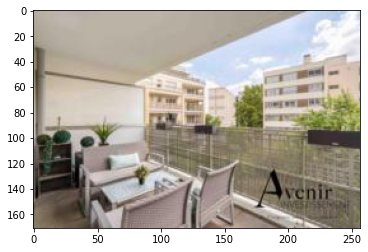

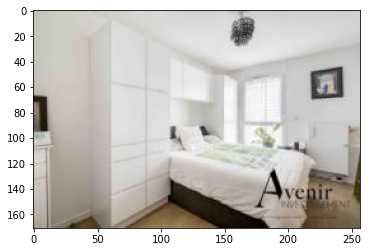

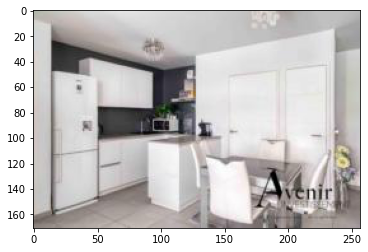

###########################################################################

Pour l'annonce N° 36048491



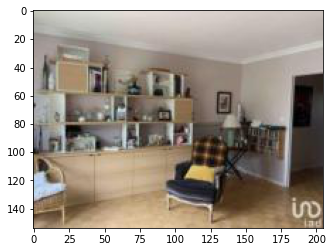

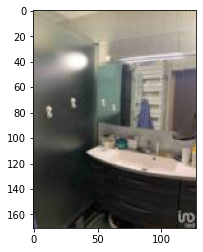

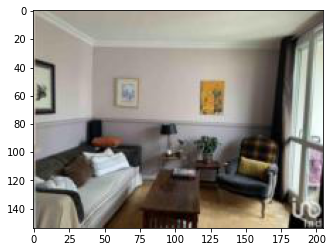

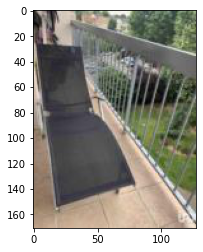

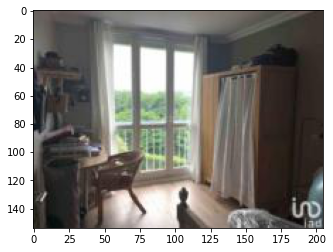

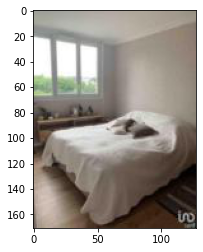

###########################################################################

Pour l'annonce N° 36049101



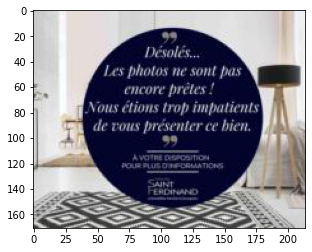

###########################################################################

Pour l'annonce N° 35886249



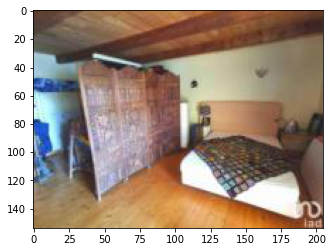

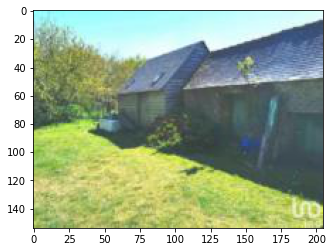

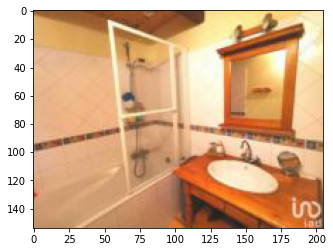

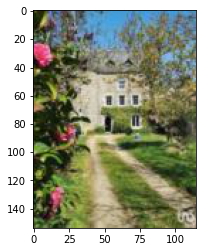

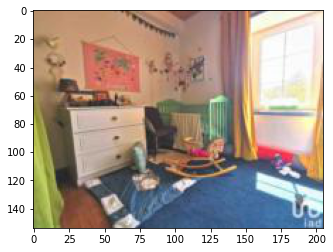

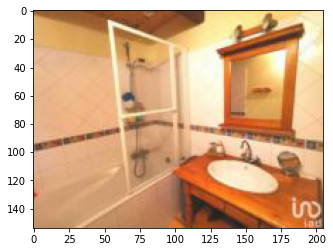

###########################################################################

Pour l'annonce N° 36058309



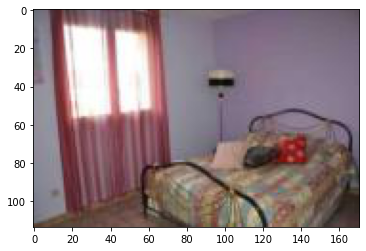

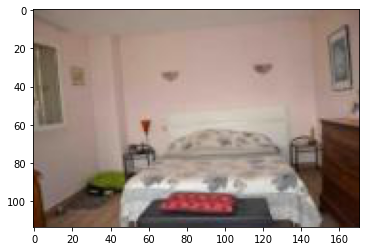

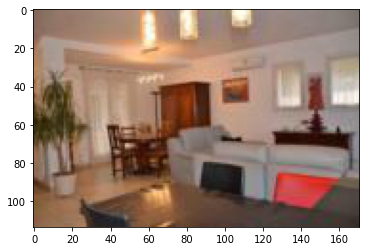

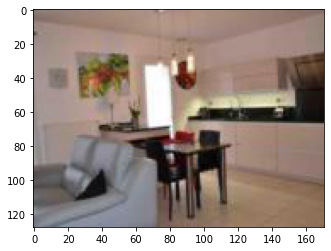

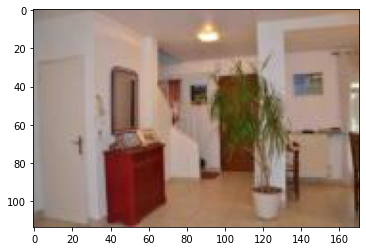

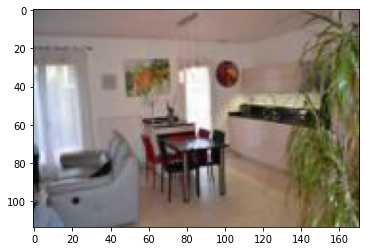

###########################################################################

Pour l'annonce N° 35783101



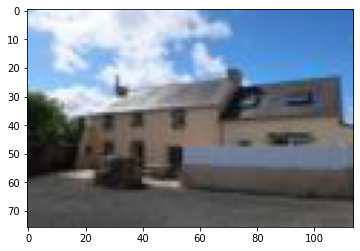

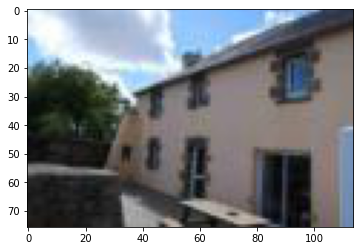

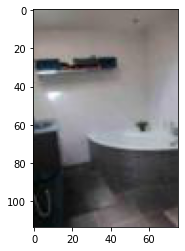

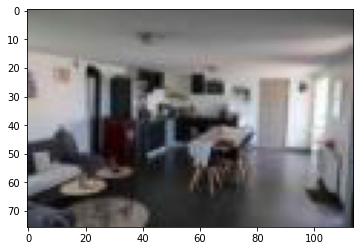

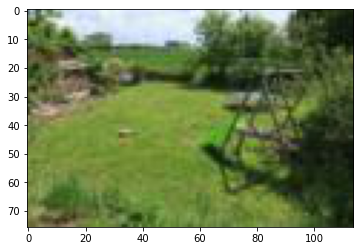

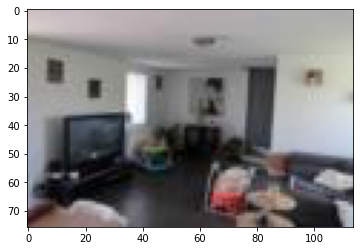

###########################################################################

Pour l'annonce N° 35996465



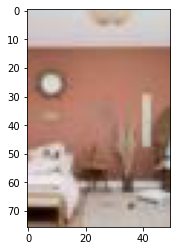

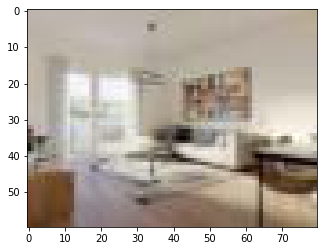

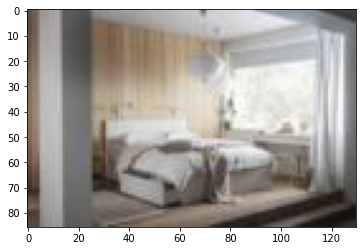

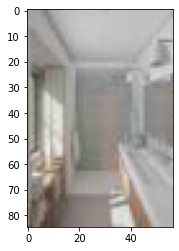

###########################################################################

Pour l'annonce N° 35856327



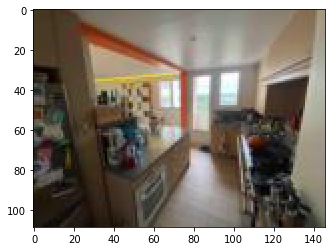

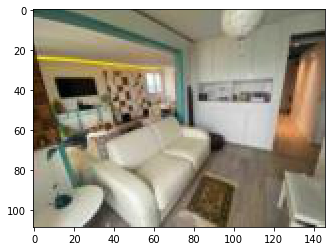

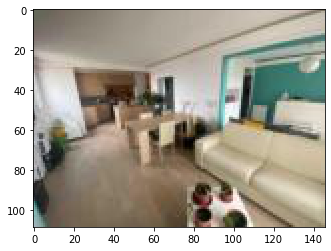

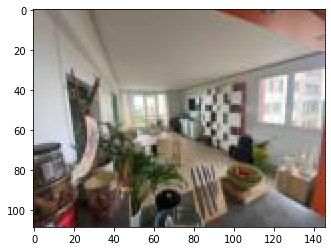

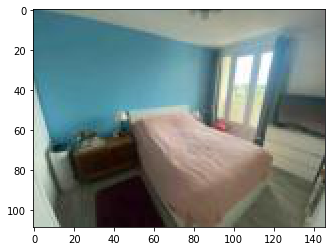

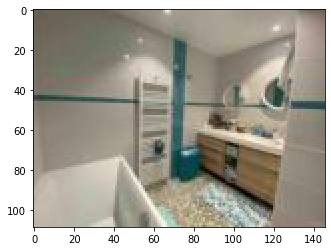

###########################################################################

Pour l'annonce N° 35862559



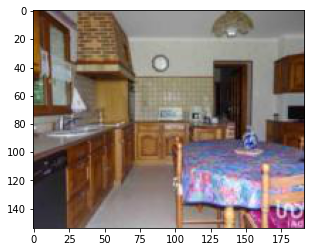

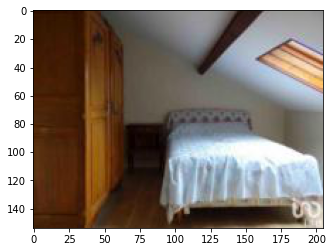

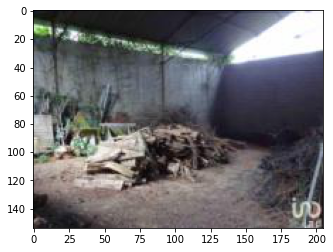

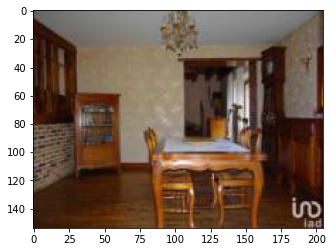

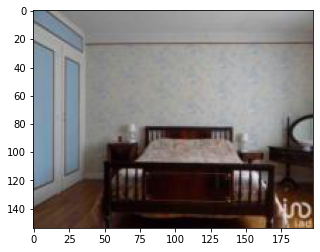

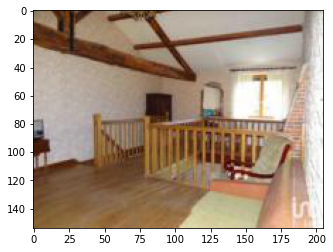

###########################################################################

Pour l'annonce N° 35999115



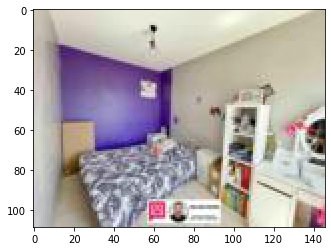

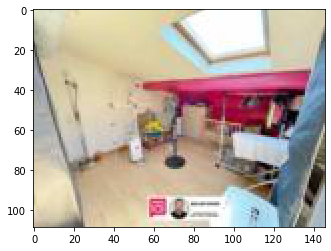

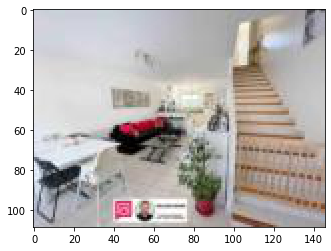

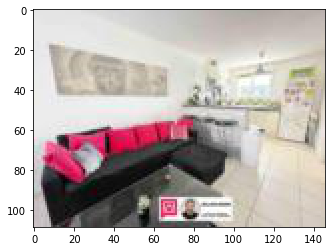

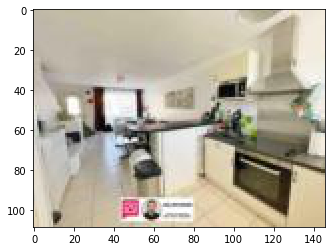

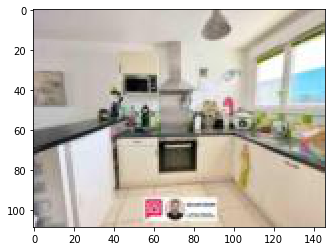

###########################################################################

Pour l'annonce N° 35817825



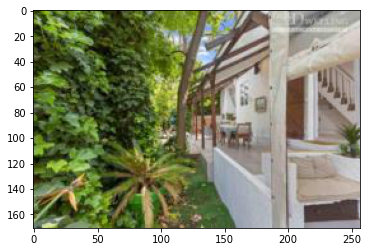

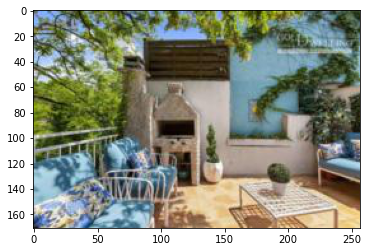

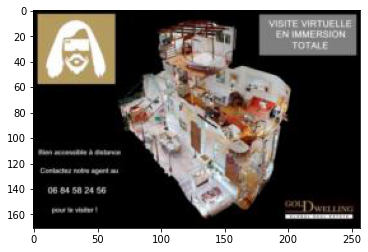

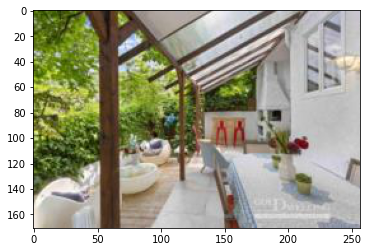

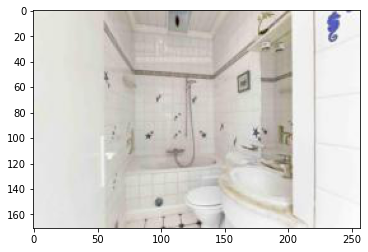

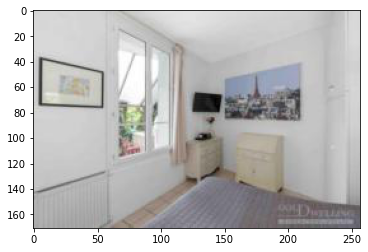

###########################################################################

Pour l'annonce N° 36066565



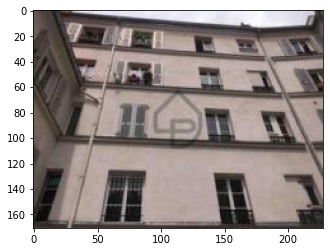

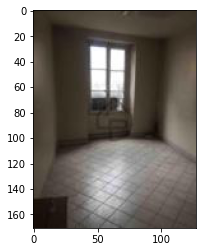

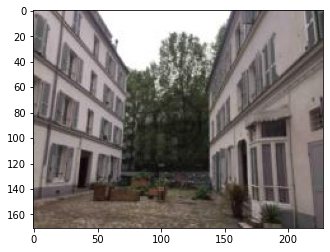

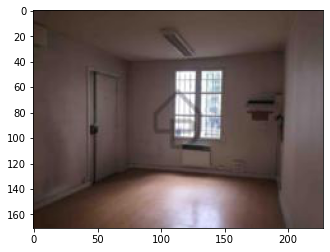

###########################################################################

Pour l'annonce N° 35834045



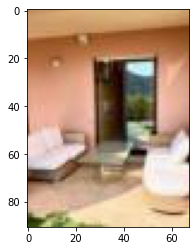

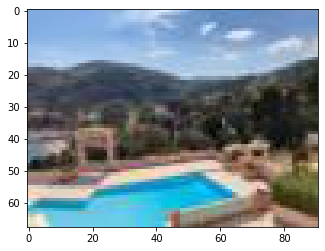

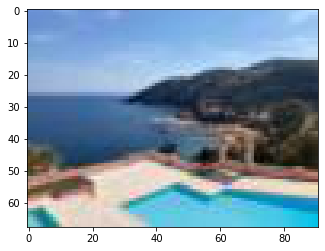

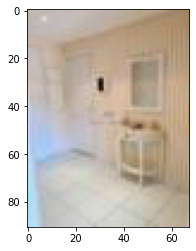

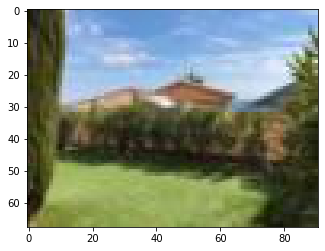

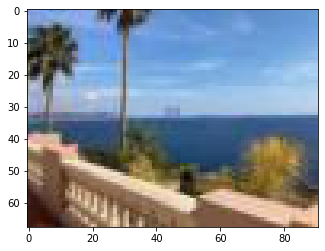

###########################################################################

Pour l'annonce N° 35768573



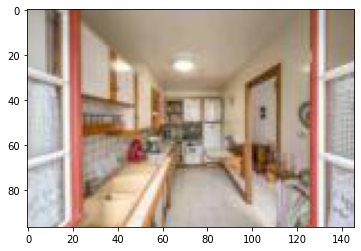

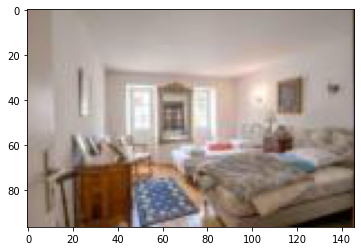

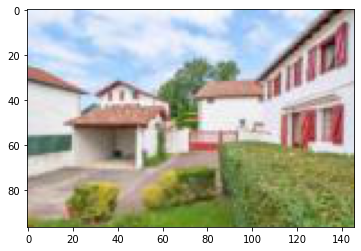

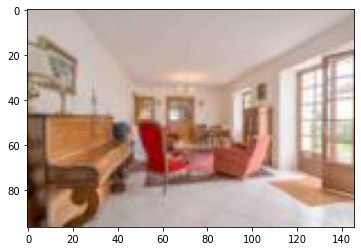

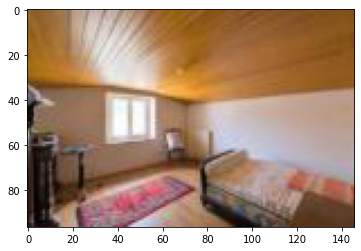

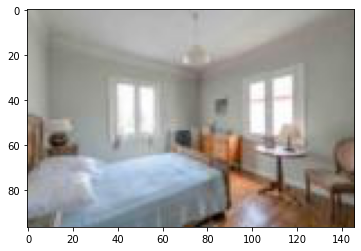

###########################################################################

Pour l'annonce N° 36045049



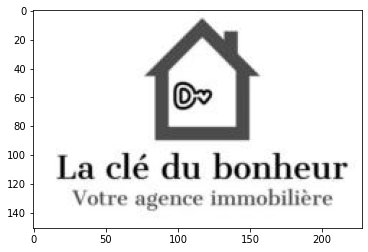

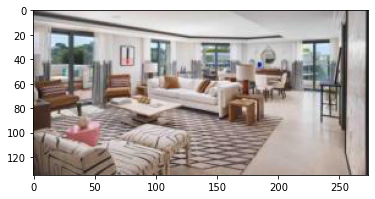

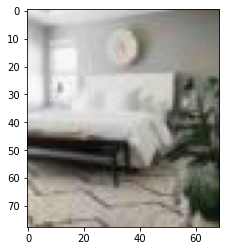

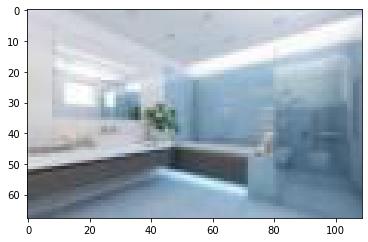

###########################################################################

Pour l'annonce N° 35998999



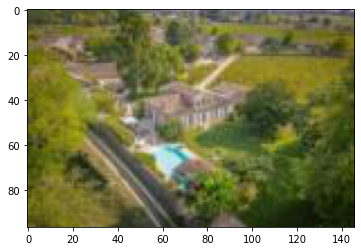

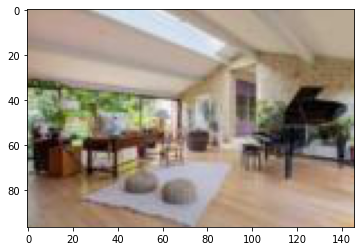

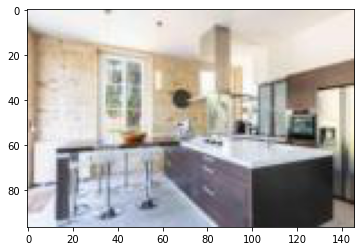

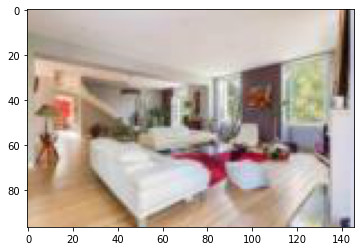

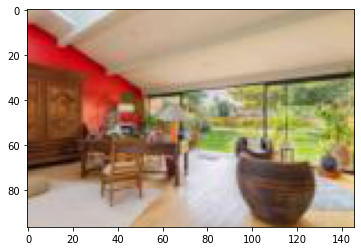

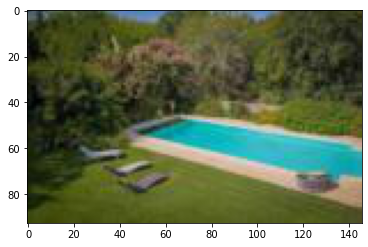

###########################################################################



In [5]:
## Affichage des photos de plusieurs annonces

#directory_in_str='D:/steve/reduced_images/test_piscine/'
directory_in_str="D:/Téléchargements/reduced_images_ILB/reduced_images/train/"
for annonce in data['id_annonce'].unique()[:20]:
    print('\033[1m' + "Pour l'annonce N° {}".format(annonce) + '\033[0m',end='\n\n')
    path=directory_in_str+'ann_'+str(annonce)
    directory = os.fsencode(path)
    for file in os.listdir(directory):
        filename = os.fsdecode(file)
        if (filename.endswith(".png") or filename.endswith(".jpg")) and os.path.getsize(path+'/'+filename)>0:
            im=mpimg.imread(path+'/'+filename)
            plt.imshow(im)
            plt.show()
            continue
        else:
            continue
    print('#####'*15,end='\n\n')

### Remarques

Nous pouvons voir qu'après l'affichage :
- Tout d'abord les images ne sont pas toutes de la même taille. Ainsi il faudra un moment les rescales une par une ( solution  : voir partie "Création des Dataset")
- Deuxièment, nous n'avons pas une seule photo par annonce, il y aura donc besoin de faire une aggrégation des images pour chaque annonces

In [6]:
data_subset=data
data_subset

,id_annonce,property_type,approximate_latitude,approximate_longitude,city,postal_code,size,floor,land_size,energy_performance_value,...,Min_ecole,nb_ecole_1kms,nb_ecole_3kms,nb_ecole_5kms,nb_ecole_10kms,nb_ecole_20kms,company_city_count,land_size_correct,size_correct,price_log
0,35996577,appartement,43.643880,7.117183,villeneuve-loubet,6270,63.0,NaN,NaN,NaN,...,1.049957,0,17,53,227,653,408.0,NaN,63.0,12.779876
1,35811033,appartement,45.695757,4.895610,venissieux,69200,90.0,3.0,NaN,223.0,...,0.180002,11,56,153,644,1155,517.0,NaN,90.0,12.154785
2,35731841,maison,47.966791,-1.220451,moutiers,35130,61.0,NaN,370.0,NaN,...,0.667630,1,3,10,17,97,145.0,370.0,61.0,10.571343
3,35886765,maison,47.289292,-1.878805,cordemais,44360,142.0,NaN,764.0,217.0,...,0.120038,2,2,5,28,142,257.0,764.0,142.0,12.608202
4,35781137,appartement,45.718992,4.844234,lyon-7eme,69007,88.0,3.0,NaN,NaN,...,0.980819,1,107,329,807,1141,1275.0,NaN,88.0,13.077368
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37345,35881571,appartement,43.480292,-1.484324,bayonne,64100,2995.0,NaN,NaN,255.0,...,0.189290,12,57,94,146,241,844.0,NaN,2995.0,12.154785
37346,35890109,appartement,48.861391,2.401158,paris-20eme,75020,36.0,4.0,NaN,229.0,...,0.230631,53,500,962,2802,5716,2887.0,NaN,36.0,12.896719
37347,36010245,appartement,44.397837,-1.164312,biscarrosse,40600,99.0,2.0,NaN,NaN,...,0.176353,4,7,7,15,24,137.0,NaN,99.0,12.700772
37348,35864579,duplex,48.864204,2.808693,magny-le-hongre,77700,9281.0,NaN,NaN,NaN,...,0.169916,5,30,58,160,804,158.0,NaN,9281.0,13.045484


In [7]:
start_time=time.time()
dic_ann={} # Dictionnaire comportant une liste des photos par anonce
y_l=[]     #Liste des target price par photo
dic_del={} #Dictionnaire avec le nombre de photo non prises en compte par annonce (exemple fichier vide)
dic_nb={}
dic_all={}
for annonce in data_subset['id_annonce'].unique():
    path=directory_in_str+'ann_'+str(annonce)
    directory = os.fsencode(path)
    count_del=0
    nb_photo=0
    im_list=[]
    for file in os.listdir(directory):
        filename = os.fsdecode(file)
        if (filename.endswith(".png") or filename.endswith(".jpg")) and os.path.getsize(path+'/'+filename)>0:
            im=mpimg.imread(path+'/'+filename)
            im_list.append(im)
            y_l.append(y_train[y_train['id_annonce']==annonce]['price'].values[0])
            nb_photo+=1
            dic_all[str(annonce)+'_'+str(int(nb_photo))]=im
        elif os.path.getsize(path+'/'+filename)==0:
            count_del+=1
    dic_nb[annonce]=nb_photo
    dic_del[annonce]=count_del
    dic_ann[annonce]=im_list
print("--------- %s secondes ---------" % (round(time.time() - start_time,2)))

--------- 1933.91 secondes ---------


### Identification des photos type logo & plan :

Ci-dessous nous avons fait un code permettant de repérer les photos d'annonceur ainsi que les plans, pour cela nous avons regardé pour chaque image si la moyenne des pixels est > 215 signifiant que l'image est composé principalement de blanc 

Ainsi on arrive quand même bien à repérer ce type de photo comme on voulait


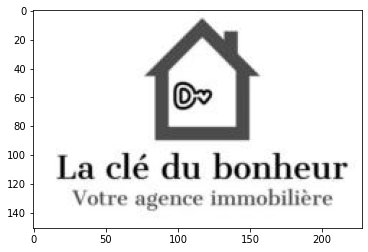

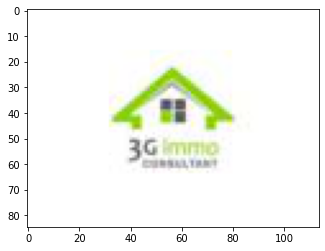

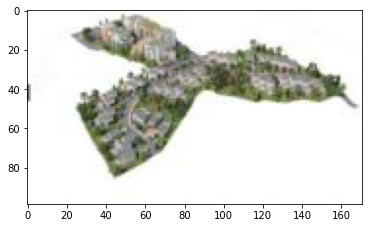

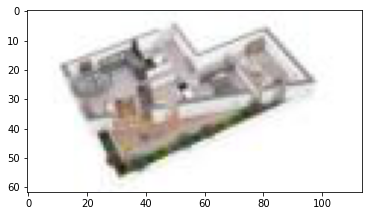

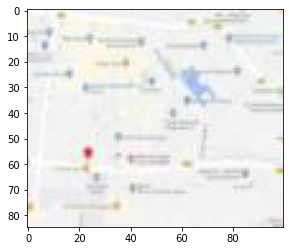

...

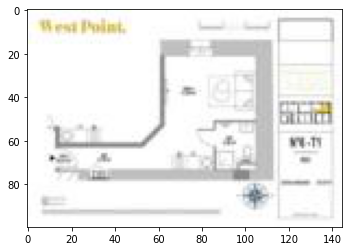

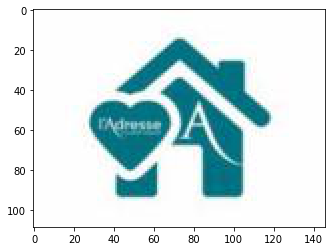

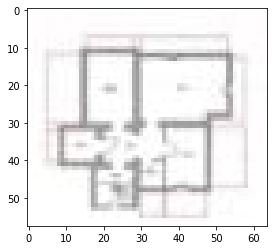

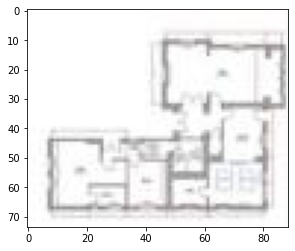

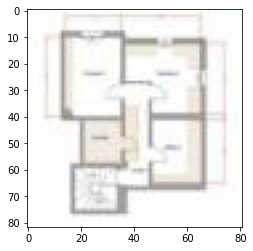

In [8]:
#Permet d'identifier des photos d'annonceur, ainsi que des plans.
max_print=100
i=0
for key, value in dic_all.items():
    if value.mean()>215: #Si la moyenne des pixels est très élevé cela signifie qu'il y a beaucoup de blanc sur la photo
        i+=1
        plt.imshow(value)
        plt.show()
    if i==max_print:
        break

Cela nous permet de rajouter la feature " count_logo " par annonce dans notre liste de variable explicatives

### Ajout Features simples


Dans cette partie on a voulu rajouter des features de la base d'une image.
Aini nous calculons la moyenne des pixels de chaque images ainsi que les moyennes des Rouges, du Bleu ainsi que le Vert present dans une image.
Puis comme dernière feature nous calculons la standard deviation. 


In [9]:
dic_res={}
dic_mean={}
dic_std={}
dic_meanC={}
dic_logo_plan={}
for key, value in dic_ann.items(): #Pour chaque annonce
    l_res=[]
    l_R=[]
    l_G=[]
    l_B=[]
    mean=[]
    std=[]
    count_plan_logo=0
    for image in value: #On parcourt ses images et on extrait les stastiques voulues
        hauteur=len(image)
        largeur=len(image[0])
        if image.mean()>215:
            count_plan_logo+=1
        l_res.append(hauteur*largeur)
        l_R.append(image[:,:,0].mean())
        l_G.append(image[:,:,1].mean())
        l_B.append(image[:,:,2].mean())
        mean.append(image.mean())
        std.append(image.std())
    dic_meanC[key]=[np.mean(x) for x in [l_R,l_G,l_B]] #On fait la moyenne des moyennes des couleurs de toutes les images
    dic_res[key]=np.mean(l_res) #On fait la moyenne de la résolution de toutes les images
    dic_mean[key]=np.mean(mean) #On fait la moyenne de la moyenne des pixels de toutes les images
    dic_std[key]=np.mean(std) #On fait la moyenne de l'ecart type des pixels de toutes les images
    dic_logo_plan[key]=count_plan_logo #On ajoute le nombre de logo & plan "trouvé"
    

In [10]:
df_image=pd.DataFrame.from_dict(dic_nb,orient='index',columns=['nb_photos'])
df_image['nb_photos_dataset']=data_subset['nb_photos'].values
df_image['resolution_moyenne']=dic_res.values()
df_image['mean_pixel']=dic_mean.values()
df_image['std_pixel']=dic_std.values()
df_image['Mean_Color']=dic_meanC.values()
df_image['mean_red']=df_image.apply(
    lambda x: x['Mean_Color'][0],axis=1)
df_image['mean_green']=df_image.apply(
    lambda x: x['Mean_Color'][1],axis=1)
df_image['mean_blue']=df_image.apply(
    lambda x: x['Mean_Color'][2],axis=1)

df_image.drop(['Mean_Color'],axis=1,inplace=True)
df_image['count_logo_plan']=dic_logo_plan.values()
df_image

,nb_photos,nb_photos_dataset,resolution_moyenne,mean_pixel,std_pixel,mean_red,mean_green,mean_blue,count_logo_plan
35996577,4,4.0,18027.250000,146.553179,49.799465,149.189747,145.994695,144.475095,0
35811033,6,8.0,38988.000000,106.381871,54.600877,111.764791,107.227455,100.153368,0
35731841,4,4.0,7296.000000,122.387438,46.776286,136.574836,122.706003,107.881476,0
35886765,6,8.0,9665.666667,127.145972,58.998721,134.186535,128.869899,118.381484,0
35781137,5,5.0,43947.000000,178.709673,48.255137,182.363297,178.911079,174.854643,0
...,...,...,...,...,...,...,...,...,...
35881571,6,7.0,14162.000000,196.897303,46.092906,202.903392,195.092972,192.695547,0
35890109,6,8.0,43947.000000,173.691388,48.880562,173.406133,172.234081,175.433951,0
36010245,5,5.0,8964.000000,167.512237,40.101257,174.443747,166.393433,161.699530,0
35864579,5,5.0,4715.400000,155.554829,49.409068,161.147888,154.113875,151.402724,0


On peut voir que le nombre de photo dans le jeu de donnée ne correspond pas à toutes les photos disponibles. En effet, on peut voir qu'ils ont capé à 6 photos maximums par annonce

In [11]:
# Changement du nom des colonnes pour éviter + Suppresion 'nb_photos_dataset' pour éviter le redondance

df_image.columns = ['nb_photos_dossier', 'nb_photos_dataset', 'resolution_moyenne', 'mean_pixel',
       'std_pixel', 'mean_red', 'mean_green', 'mean_blue', 'count_logo_plan']
df_image.drop(['nb_photos_dataset'],axis=1,inplace=True)
df_image

,nb_photos_dossier,resolution_moyenne,mean_pixel,std_pixel,mean_red,mean_green,mean_blue,count_logo_plan
35996577,4,18027.250000,146.553179,49.799465,149.189747,145.994695,144.475095,0
35811033,6,38988.000000,106.381871,54.600877,111.764791,107.227455,100.153368,0
35731841,4,7296.000000,122.387438,46.776286,136.574836,122.706003,107.881476,0
35886765,6,9665.666667,127.145972,58.998721,134.186535,128.869899,118.381484,0
35781137,5,43947.000000,178.709673,48.255137,182.363297,178.911079,174.854643,0
...,...,...,...,...,...,...,...,...
35881571,6,14162.000000,196.897303,46.092906,202.903392,195.092972,192.695547,0
35890109,6,43947.000000,173.691388,48.880562,173.406133,172.234081,175.433951,0
36010245,5,8964.000000,167.512237,40.101257,174.443747,166.393433,161.699530,0
35864579,5,4715.400000,155.554829,49.409068,161.147888,154.113875,151.402724,0


In [12]:
df_image.columns.values

array(['nb_photos_dossier', 'resolution_moyenne', 'mean_pixel',
       'std_pixel', 'mean_red', 'mean_green', 'mean_blue',
       'count_logo_plan'], dtype=object)

### Test ajout features :

Nous ré-entrainons les modèles précédemment optimisés avec nos nouvelles features (le temps de calcul étant long nous ne refaison pas l'optimisation). 

Récupération des données, retraitement identique aux modèles sans features liées aux photos.

In [90]:
data=data.merge(df_image,how='left',left_on='id_annonce',right_index=True)
new_features_image_num=df_image.columns[1:].values.tolist() # on enleve le nombre de photo de l'annonce recalculé
new_features_image_num

['resolution_moyenne',
 'mean_pixel',
 'std_pixel',
 'mean_red',
 'mean_green',
 'mean_blue',
 'count_logo_plan']

In [91]:
numerical_features_orgin=['approximate_latitude','approximate_longitude','size_correct','floor','land_size_correct', \
                          'energy_performance_value','ghg_value','nb_rooms','nb_bedrooms','nb_bathrooms',\
                          'nb_parking_places','nb_boxes','nb_photos','has_a_balcony','nb_terraces','has_a_cellar',\
                          'has_a_garage','has_air_conditioning','last_floor','upper_floors','postal_code',] 
additional_n_features= ['ecole_count', 'Min_gare', 'nb_gare_1kms', 'nb_gare_3kms',\
                        'nb_gare_5kms', 'nb_gare_10kms', 'nb_gare_20kms', 'Min_ecole',\
                        'nb_ecole_1kms', 'nb_ecole_3kms', 'nb_ecole_5kms',\
                        'nb_ecole_10kms', 'nb_ecole_20kms', 'company_city_count']

keep_additional_features=['ecole_count','Min_ecole','nb_ecole_1kms','Min_gare','nb_gare_1kms',\
                          'nb_gare_20kms','company_city_count']

numerical_features=numerical_features_orgin+keep_additional_features+new_features_image_num

categorical_features=['property_type','city','energy_performance_category','ghg_category','exposition']

features_all=numerical_features+categorical_features

target='price_log'

# première analyse de correlation et importances des features : Drop : code postal, nb_rooms, longitude, latitude
list_sup=['nb_rooms','city','last_floor']
for tosup in list_sup:
    features_all.remove(tosup)
    if tosup in numerical_features:
        numerical_features.remove(tosup)
    if tosup in categorical_features:
        categorical_features.remove(tosup)
    
features_all #Toutes les features

#Sépare train/test
X = data[features_all]
y = data[target]
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state = 42)

numerical_features_0=['floor','land_size_correct']
numerical_features_mean=[i for i in numerical_features if not i in numerical_features_0]

In [92]:
# On reprend nos modèles précedemment optimisé

models_BestParam = [('GradientB_reg',GradientBoostingRegressor(loss='lad',learning_rate=0.1,max_depth= 5,\
                                                     n_estimators=500,subsample= 0.8)),
          
          
          ('adaboost',AdaBoostRegressor(random_state=0,learning_rate=0.1,n_estimators=100,loss='linear',\
                          base_estimator=DecisionTreeRegressor(max_depth= 6,min_samples_leaf= 0.01))),
          
          
          ("xgboost",  XGBRegressor(min_child_weight=0,learning_rate=0.09,n_estimators= 3000,\
                       gamma=0, subsample=0.7,max_depth= 6,\
                       colsample_bytree=1.0,\
                       objective='reg:squarederror', nthread=-1,\
#                       eval_metric='mape',\ #Ne marche pas sous version Mac mais résultats identiques
                       scale_pos_weight=1, seed=27,\
                       reg_alpha=0.00006))
         ]

In [93]:
numeric_transformer0 = Pipeline(steps=[
                                    ("imputer",SimpleImputer(strategy="constant", fill_value=0)),
                                    ('scaler', StandardScaler())])# to deal with missing numeric data : 0

numeric_transformer_mean = Pipeline(steps=[
                                    ("imputer",SimpleImputer(strategy="mean")),
                                    ('scaler', StandardScaler())])# to deal with missing numeric data : mean

categorical_transformer = Pipeline(steps=[
                                    ("imputer", SimpleImputer(strategy="constant", fill_value="Not defined")),
                                    ("onehot", OneHotEncoder(handle_unknown='ignore'))]) # to deal with missing categorical data 

preproc = ColumnTransformer(transformers=[("num0", numeric_transformer0, numerical_features_0),
                                          ("num_mean", numeric_transformer_mean, numerical_features_mean),
                                          ("cat", categorical_transformer, categorical_features)])


save_model=[]
for name, model in models_BestParam:
    start_time=time.time()
    pipe_BestParam = Pipeline(steps=[('preprocessor', preproc), (name, model)])
    pipe_BestParam.fit(X_train, y_train)
    save_model.append(pipe_BestParam)
    print(name)
    print("--------- %s secondes ---------" % (round(time.time() - start_time,2)))
    print('-----------------------------------------------------')


GradientB_reg
--------- 240.47 secondes ---------
-----------------------------------------------------
adaboost
--------- 62.31 secondes ---------
-----------------------------------------------------
xgboost
--------- 194.97 secondes ---------
-----------------------------------------------------


In [94]:
def plot_tab_score(all_tab,name_models):
    fig, axs = plt.subplots(3, 2, figsize=(16, 10))
    all_log=[x[0] for x in all_tab]
    all_normal=[x[1] for x in all_tab]
    #name=['RdmForest','Gradient_Boost','Ada_Boost','XGBoost']
    name_metrics=all_log[0].index
    for metric in range(len(name_metrics)):
        for table in all_log:
            #tab_score.iloc[1,:]
            axs[metric,0].plot(table.iloc[metric,:])

            #plt.plot(tab_score_xgb.iloc[1,:])
        axs[metric,0].set_title((name_metrics[metric]))
        axs[metric,0].legend(name_models)
    for metric in range(len(name_metrics)):
        for table in all_normal:
            #tab_score.iloc[1,:]
            axs[metric,1].plot(table.iloc[metric,:])

            #plt.plot(tab_score_xgb.iloc[1,:])
        axs[metric,1].set_title((name_metrics[metric]))
        axs[metric,1].legend(name_models)
        
#Fonctions permettant d'afficher des résultats

def metrics_score(y_real,y_pred):
    mean_squared_error1 = round(mean_squared_error(y_real, y_pred),4)
    explained_variance_score1 = round(explained_variance_score(y_real, y_pred),4)
    mean_absolute_percentage_error1 = round(mean_absolute_percentage_error(y_real, y_pred),4)
    return({'mean_squared_error' : mean_squared_error1,
            'explained_variance_score' : explained_variance_score1,
            'mean_absolute_percentage_error' : mean_absolute_percentage_error1*100,
           })


def score_log_normal(X_train,X_test,y_train,y_test,model):
    y_pred_train_log = model.predict(X_train)
    y_pred_test_log = model.predict(X_test)
    y_pred_train = np.expm1(y_pred_train_log)
    y_pred_test = np.expm1(y_pred_test_log)
    
    
    dic_train_log=metrics_score(y_train,y_pred_train_log)
    dic_test_log=metrics_score(y_test,y_pred_test_log) 
    tab_score_log=pd.DataFrame(dic_train_log.values(),index=list(dic_train_log.keys()),columns=['Train'])
    tab_score_log['Test']=dic_test_log.values()
    print('\033[1m' +'Sur prix Log'+ '\033[0m')
    print(tab_score_log,end='\n\n')
    
    dic_train=metrics_score(np.expm1(y_train),y_pred_train)
    dic_test=metrics_score(np.expm1(y_test),y_pred_test)
    
    tab_score=pd.DataFrame(dic_train.values(),index=list(dic_test.keys()),columns=['Train'])
    tab_score['Test']=dic_test.values()
    print('\033[1m' +'Sur prix Normaux'+ '\033[0m')
    print(tab_score)
    return [tab_score_log,tab_score]

In [95]:
all_tab=[]

name=['Gradient_Boost','Ada_Boost','XGBoost']

for i in range(len(save_model)):
    name_m=name[i]
    model=save_model[i]

    print('Résultat pour',name_m,end='\n\n')
    all_tab.append(score_log_normal(X_train,X_test,y_train,y_test,model))
    print('')
    print('#################'*3,end='\n\n')

Résultat pour Gradient_Boost

Sur prix Log
                                 Train    Test
mean_squared_error              0.1170  0.1555
explained_variance_score        0.8206  0.7646
mean_absolute_percentage_error  1.8600  2.2500

Sur prix Normaux
                                       Train          Test
mean_squared_error              2.007170e+10  2.731405e+10
explained_variance_score        7.944000e-01  7.252000e-01
mean_absolute_percentage_error  2.481000e+01  3.055000e+01

###################################################

Résultat pour Ada_Boost

Sur prix Log
                                 Train    Test
mean_squared_error              0.2421  0.2567
explained_variance_score        0.6300  0.6129
mean_absolute_percentage_error  3.0800  3.1300

Sur prix Normaux
                                       Train          Test
mean_squared_error              4.615544e+10  4.908070e+10
explained_variance_score        5.564000e-01  5.371000e-01
mean_absolute_percentage_error  4.113000

### Commentaires : 

Pour rappel, les résultats étaient les suivants sans les features photos : 

**SCORE TEST :** (en gras les nouveaux)
* AdaBoost : 42.1 / **42.2**
* Gradient Boost : 30.03 / **30.05**
* XGBoost : 27.4 / **27.5**

Sans surprise, l'ajout de ces features "naïves" n'améliore pas les méthodes et vient meme légérement réduire les résultats. La plupart de ces features sont celles implémenté par le benchmark.

###  Identification de la présence d'une piscine avec CNN 

Dans la suite nous avons voulu essayer de rajouter des features sorties directement des images des appartements.

Ainsi nous allons essayer de detecter sur les images la présence d'une piscine

In [13]:
EPOCHS                  = 10   # Nombre d'epoch
image_size               = (224,224)    # Taille des images
BATCH_SIZE              = 32    # Pour le traitement par lot des images (optimisation de la decente de gradient)
STOPPING_PATIENCE       = 10    # Callback pour stopper si le modèle n'apprend plus
VERBOSE                 = 0     # Niveau de verbosité
MODEL_NAME              = 'cnn_80epochs_imgsize160'
OPTIMIZER               = 'adam'
TEST_PATH               = './test_piscine/'
TRAINING_DIR_PISCINE    = "./train_piscine/"
TRAIN_MODEL             = True  # Entrainement du modele (True) ou chargement (False)
batch_size = 32


### Création des dataset 

Nous avons créer un dossier composé de deux dossier servant de labels. 
Le premier dossier est 0_piscine indiquant que c'est un dossier ne contenant pas de photos de piscine.
Le deuxième dossier est 1_piscine indiquant qu'il est composé de photos de piscines

Ainsi avec la fonction image_dataset_from_directory il est possible de créer directement des dataset labélisé 

De plus cela nous permet de vous rescale les images avant de les insérer dans le Dataset et les mettres tous à la même taille

In [40]:

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    TRAINING_DIR_PISCINE,
    label_mode='categorical',
    validation_split=0.2,
    subset="training",
    seed=1337,
    color_mode="rgb",
    image_size=image_size,
    batch_size=batch_size,
)
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    TRAINING_DIR_PISCINE,
    validation_split=0.2,
    subset="validation",
    label_mode='categorical',
    seed=1337,
    color_mode="rgb",
    image_size=image_size,
    batch_size=batch_size,
)

test = tf.keras.preprocessing.image_dataset_from_directory(
    TEST_PATH,
    label_mode=None,
    seed=1337,
    color_mode="rgb",
    image_size=image_size,
    batch_size=batch_size,
)

Found 402 files belonging to 2 classes.
Using 322 files for training.
Found 402 files belonging to 2 classes.
Using 80 files for validation.
Found 561 files belonging to 1 classes.


### Affichage de la base de train :

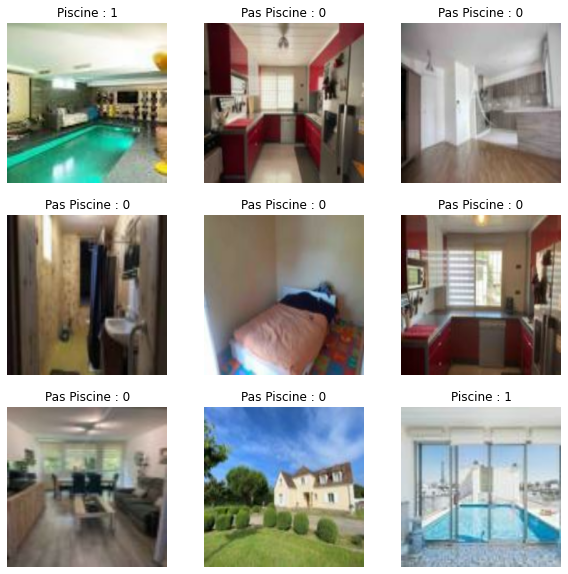

In [15]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        if labels[i][0].numpy()==0.0:
            plt.title("Piscine : 1")
        else:
            plt.title("Pas Piscine : 0")
        plt.axis("off")

### Essayons un premier réseau de neurones afin de détecter des piscines

In [16]:
# Initialisation du modèle
from tensorflow.keras.models import Model

data_augmentation = tf.keras.Sequential([
  tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),
  tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
tf.keras.layers.experimental.preprocessing.RandomCrop(224,224),
    tf.keras.layers.experimental.preprocessing.Rescaling(1./255),
tf.keras.layers.Conv2D(filters=16,
                      kernel_size=3,
                      strides=1,
                      padding='same',
                      input_shape=(224, 224, 3),
                      activation='relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2),
tf.keras.layers.Conv2D(filters=16,
                      kernel_size=3,
                      strides=1,
                      padding='same',
                      activation='relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2),
tf.keras.layers.Dropout(0.1),
tf.keras.layers.Conv2D(filters=32,
                      kernel_size=3,
                      strides=1,
                      padding='same',
                      activation='relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2),
tf.keras.layers.Conv2D(filters=32,
                      kernel_size=3,
                      strides=1,
                      padding='same',
                      activation='relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2),
tf.keras.layers.Flatten(),
tf.keras.layers.Dense(512, activation='relu'),
tf.keras.layers.Dropout(0.1)
])

inputs = tf.keras.Input(shape=(224,224,3))
x = data_augmentation(inputs)
#x = preprocess_input(x)

#x = GlobalAveragePooling2D()(x)
y = Dense(2, activation='softmax')(x) #final layer with softmax activation
model = Model(inputs=inputs, outputs=y, name="Steven/Thomas")

model.compile(
    optimizer=OPTIMIZER,
    loss='categorical_crossentropy',
    metrics=['accuracy','AUC'])
model.summary()  # As a reminder.



Model: "Steven/Thomas"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 512)               3228816   
                                                                 
 dense_1 (Dense)             (None, 2)                 1026      
                                                                 
Total params: 3,229,842
Trainable params: 3,229,650
Non-trainable params: 192
_________________________________________________________________


In [17]:

history = model.fit(train_ds, epochs=20, validation_data=val_ds)

Epoch 1/20
9/9 [==============================] - 33s 3s/step - loss: 2.0525 - accuracy: 0.8093 - auc: 0.8484 - val_loss: 1.0318 - val_accuracy: 0.5469 - val_auc: 0.6941
Epoch 2/20
9/9 [==============================] - 28s 3s/step - loss: 1.0268 - accuracy: 0.8794 - auc: 0.9238 - val_loss: 6.7566 - val_accuracy: 0.4688 - val_auc: 0.4688
Epoch 3/20
9/9 [==============================] - 29s 3s/step - loss: 0.4483 - accuracy: 0.9261 - auc: 0.9542 - val_loss: 11.3468 - val_accuracy: 0.4688 - val_auc: 0.4688
Epoch 4/20
9/9 [==============================] - 28s 3s/step - loss: 0.3900 - accuracy: 0.9144 - auc: 0.9594 - val_loss: 14.3922 - val_accuracy: 0.4688 - val_auc: 0.4688
Epoch 5/20
9/9 [==============================] - 29s 3s/step - loss: 0.4069 - accuracy: 0.9222 - auc: 0.9557 - val_loss: 17.8847 - val_accuracy: 0.4688 - val_auc: 0.4688
Epoch 6/20
9/9 [==============================] - 28s 3s/step - loss: 0.3478 - accuracy: 0.9027 - auc: 0.9588 - val_loss: 21.9959 - val_accuracy: 0

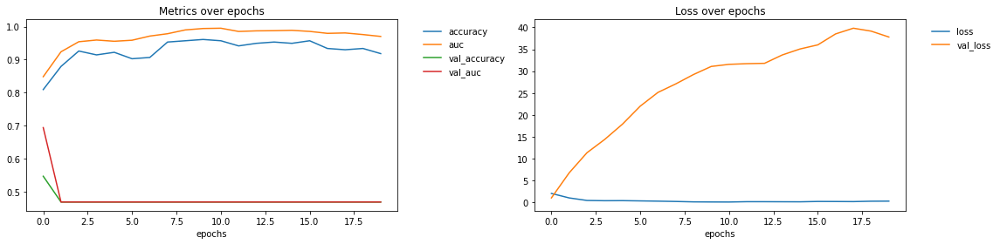

In [18]:
fig, axs = plt.subplots(1, 2, figsize=(16, 4))

axs[0].plot(history.history["accuracy"], label="accuracy")
axs[0].plot(history.history["auc"], label="auc")

axs[0].plot(history.history["val_accuracy"], label="val_accuracy")
axs[0].plot(history.history["val_auc"], label="val_auc")

axs[0].set_title("Metrics over epochs")
axs[0].set_xlabel("epochs")

axs[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)

axs[1].plot(history.history["loss"], label="loss")
axs[1].plot(history.history["val_loss"], label="val_loss")

axs[1].set_title("Loss over epochs")
axs[1].set_xlabel("epochs")
axs[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)

fig.tight_layout()
plt.show()

### Notre modèle n'a pas une très bonne accuracy sur le validation set, ainsi il ne va pas très bien prédire. Fort overfitting qui est visible.

In [21]:
from keras import models
test_iamges  = os.listdir(TEST_PATH)
# Extracts the outputs of the top 4 layers:
layer_outputs = [layer.output for layer in model.layers[:4]]
# Creates a model that will return these outputs, given the model input:
activation_model = model

def preprocess_image(img_path):
    image = load_img(img_path, target_size=image_size)
    image = img_to_array(image) 
    # change it to shape [1, 150, 150, 3]
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    image = preprocess_input(image)
    #img_tensor = np.expand_dims(img_tensor, axis=0)
    #img_tensor /= 255.
    return image

plt.figure(figsize=(5, 5))
for index, image in enumerate(test_iamges):  #test
    for file in os.listdir(TEST_PATH + image+'/'):
        filename = TEST_PATH + image+'/'+file
        img = preprocess_image(filename)
        prediction = model.predict(img)
        #plt.subplot(5, 5, index+1)
        if prediction[0][0] > 0.5:
            plt.title('not piscine %.2f%%' % (100 - prediction[0][1]*100))
        else:
            plt.title('piscine %.2f%%' % (prediction[0][1]*100))

        plt.axis('off')
        plt.imshow(img[0])
        plt.show()

NameError: name 'test_iamges' is not defined

<Figure size 360x360 with 0 Axes>

 

# <center> VGG16 </center>

#### Nous allons utiliser un modèle déjà entrainé sous le nom de VGG16
Cet algorithme contient des paramètres déjà entrainé

In [23]:
TEST_PATH_ = "D:/Téléchargements/reduced_images_ILB/reduced_images/train/"
test_ = tf.keras.preprocessing.image_dataset_from_directory(
    TEST_PATH_,
    label_mode=None,
    seed=1337,
    color_mode="rgb",
    image_size=image_size,
    batch_size=batch_size,
)

Found 190699 files belonging to 1 classes.


### Cet algorithme est entrainé sur environ 1000 catégorie, nous avons donc changé la sortie du réseau en ajoutant une sortie binaire sur la dernière couche

In [41]:
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input


#def add_new_classifier_head(feature_extractor_model):
#    model = Sequential([ feature_extractor_model, feature_extractor_model.input,
#        tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),
#  tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
#tf.keras.layers.experimental.preprocessing.RandomCrop(224,224),
#    tf.keras.layers.experimental.preprocessing.Rescaling(1./255), 
#        Dense(2, activation='softmax')])
    
#    return model


model = VGG16(weights='imagenet', include_top=True)
model.trainable = False
print(model.output.shape)
y = Dense(2, activation='softmax')((model.layers[-2].output))#final layer with softmax activation
model = Model(inputs=model.input, outputs=y, name="VGG16")
model.compile(
    optimizer=OPTIMIZER,
    loss='categorical_crossentropy',
    metrics=['accuracy','AUC',"Recall"])
print(model.summary())

(None, 1000)
Model: "VGG16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)

### Plot des Metrics et des Loss

Epoch 1/5
11/11 [==============================] - 467s 43s/step - loss: 0.6663 - accuracy: 0.7578 - auc: 0.8234 - recall: 0.7578 - val_loss: 0.5740 - val_accuracy: 0.7625 - val_auc: 0.8523 - val_recall: 0.7625
Epoch 2/5
11/11 [==============================] - 461s 42s/step - loss: 0.2343 - accuracy: 0.9130 - auc: 0.9667 - recall: 0.9130 - val_loss: 0.3054 - val_accuracy: 0.8500 - val_auc: 0.9448 - val_recall: 0.8500
Epoch 3/5
11/11 [==============================] - 451s 41s/step - loss: 0.1350 - accuracy: 0.9441 - auc: 0.9890 - recall: 0.9441 - val_loss: 0.3860 - val_accuracy: 0.8375 - val_auc: 0.9330 - val_recall: 0.8375
Epoch 4/5
11/11 [==============================] - 461s 42s/step - loss: 0.0864 - accuracy: 0.9689 - auc: 0.9956 - recall: 0.9689 - val_loss: 0.2968 - val_accuracy: 0.8875 - val_auc: 0.9544 - val_recall: 0.8875
Epoch 5/5
11/11 [==============================] - 468s 43s/step - loss: 0.0377 - accuracy: 0.9969 - auc: 0.9999 - recall: 0.9969 - val_loss: 0.3562 - val_a

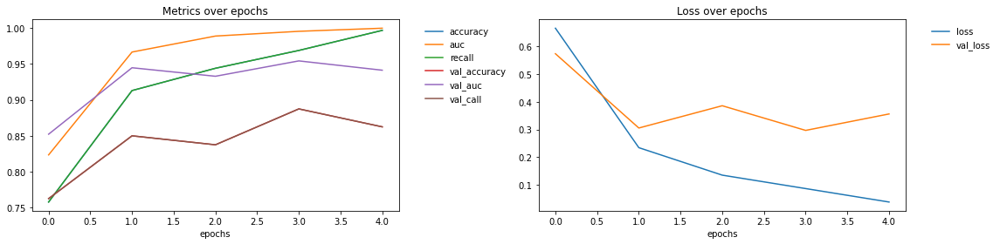

In [43]:

history = model.fit(train_ds, epochs=5, validation_data=val_ds)

fig, axs = plt.subplots(1, 2, figsize=(16, 4))

axs[0].plot(history.history["accuracy"], label="accuracy")
axs[0].plot(history.history["auc"], label="auc")
axs[0].plot(history.history["recall"], label="recall")


axs[0].plot(history.history["val_accuracy"], label="val_accuracy")
axs[0].plot(history.history["val_auc"], label="val_auc")
axs[0].plot(history.history["val_recall"], label="val_call")

axs[0].set_title("Metrics over epochs")
axs[0].set_xlabel("epochs")

axs[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)

axs[1].plot(history.history["loss"], label="loss")
axs[1].plot(history.history["val_loss"], label="val_loss")

axs[1].set_title("Loss over epochs")
axs[1].set_xlabel("epochs")
axs[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)

fig.tight_layout()
plt.show()

In [26]:
test_iamges  = os.listdir(TEST_PATH_)

from keras.preprocessing.image import load_img, img_to_array
from keras.applications.vgg16 import decode_predictions

from keras.applications.vgg16 import preprocess_input

def preprocess_imageVGG(img_path):
    image = load_img(img_path, target_size=image_size)
    image = img_to_array(image) 
    image = np.expand_dims(image, axis=0)
    image = preprocess_input(image)
    return image



def deprocess_img(processed_img):
    x = processed_img.copy()
    if len(x.shape) == 4:
        x = np.squeeze(x, 0)
    assert len(x.shape) == 3, ("Input to deprocess image must be an image of "
                             "dimension [1, height, width, channel] or [height, width, channel]")
    if len(x.shape) != 3:
        raise ValueError("Invalid input to deprocessing image")

    # perform the inverse of the preprocessiing step
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    x = x[:, :, ::-1]

    x = np.clip(x, 0, 255).astype('uint8')
    return x

### Prédiction sur un plus petit échantillon de test (561 lignes)

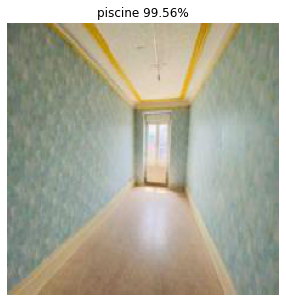

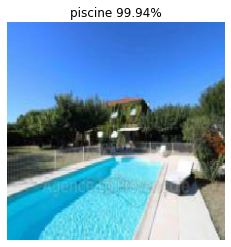

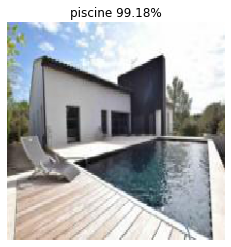

In [44]:
test_iamges  = os.listdir(TEST_PATH)

plt.figure(figsize=(5, 5))
for index, image in enumerate(test_iamges):
    for file in os.listdir(TEST_PATH + image+'/'):
        filename = TEST_PATH + image+'/'+file
        img = preprocess_imageVGG(filename)
        prediction = model.predict(img)
        if prediction[0][1]>0.50:
            plt.axis('off')
            ima_dep= deprocess_img(img)
            plt.title('piscine %.2f%%' % (prediction[0][1]*100))
            plt.imshow(ima_dep)
            plt.show()

In [78]:
df=data.copy()
df.set_index('id_annonce',inplace=True)

### On peut voir que notre VGG16 arrive à prédire avec une proba >99.87% des piscines

### Test sur toutes nos images

In [39]:
test_iamges  = os.listdir(TEST_PATH_)

dic_ = {"annonce": [],"nom_image":[],"prediction_1" : []}

plt.figure(figsize=(5, 5))
for index, image in enumerate(test_iamges):
    for file in os.listdir(TEST_PATH_ + image+'/'):
        filename = TEST_PATH_ + image+'/'+file
        #print(filename)
        #print(os.path.getsize(filename))
        #print((filename.endswith(".jpg")))
        if (filename.endswith(".png") or filename.endswith(".jpg")) and os.path.getsize(filename)>0 and \
        (not df.loc[int(image.split("_")[1]),'property_type'] in ['appartement','parking','terrain']):
            img = preprocess_imageVGG(filename)
            prediction = model.predict(img)
            dic_["annonce"].append(image.split("_")[1])
            dic_["nom_image"].append(file)
            dic_["prediction_1"].append(prediction[0][1])
            continue
        else:
            continue  

KeyboardInterrupt: 

<Figure size 360x360 with 0 Axes>

In [ ]:
df=pd.DataFrame(dic_)
df['piscine']=df['prediction_1']>0.997
df['piscine']=df['piscine'].astype(int)
df_to_merge = df.groupby(['annonce'])["piscine"].sum().to_frame()

In [ ]:
#df.groupby(['annonce'])["piscine"].value_counts()


In [ ]:
#df.groupby(["annonce","piscine"]).count()

In [ ]:
#df.groupby((df.piscine == 1).astype(int)).count()

# FIN DES FEATURES : PLACE AU MODELE

In [ ]:
data

In [ ]:
df_image = df_image.merge(df_to_merge,how='left',left_on='id_annonce',right_index=True)
data=data.merge(df_image,how='left',left_on='id_annonce',right_index=True)
data

In [ ]:
new_features_image_num=df_image.columns[1:-1].values.tolist() # on enleve la feature categoriel et le nombre de photos
new_features_image_cat=df_image.columns[-1]
new_features_image_num

In [ ]:
numerical_features_orgin=['approximate_latitude','approximate_longitude','size_correct','floor','land_size_correct', \
                          'energy_performance_value','ghg_value','nb_rooms','nb_bedrooms','nb_bathrooms',\
                          'nb_parking_places','nb_boxes','nb_photos','has_a_balcony','nb_terraces','has_a_cellar',\
                          'has_a_garage','has_air_conditioning','last_floor','upper_floors','postal_code',] 
additional_n_features= ['ecole_count', 'Min_gare', 'nb_gare_1kms', 'nb_gare_3kms',\
                        'nb_gare_5kms', 'nb_gare_10kms', 'nb_gare_20kms', 'Min_ecole',\
                        'nb_ecole_1kms', 'nb_ecole_3kms', 'nb_ecole_5kms',\
                        'nb_ecole_10kms', 'nb_ecole_20kms', 'company_city_count']

keep_additional_features=['ecole_count','Min_ecole','nb_ecole_1kms','Min_gare','nb_gare_1kms',\
                          'nb_gare_20kms','company_city_count']

numerical_features=numerical_features_orgin+keep_additional_features+new_features_image_num

categorical_features=['property_type','city','energy_performance_category','ghg_category','exposition']

features_all=numerical_features+categorical_features+new_features_image_cat

target='price_log'

# première analyse de correlation et importances des features : Drop : code postal, nb_rooms, longitude, latitude
list_sup=['nb_rooms','city','last_floor']
for tosup in list_sup:
    features_all.remove(tosup)
    if tosup in numerical_features:
        numerical_features.remove(tosup)
    if tosup in categorical_features:
        categorical_features.remove(tosup)
    
features_all




In [ ]:
numerical_features_0=['floor','land_size_correct']
numerical_features_mean=[i for i in numerical_features if not i in numerical_features_0]

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.model_selection import KFold
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split

from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix

from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import mean_squared_error,explained_variance_score, mean_absolute_percentage_error

from sklearn.linear_model import ElasticNetCV, LassoCV, RidgeCV
from sklearn.linear_model import ElasticNet, Lasso, Ridge
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR

In [ ]:
models_BestParam = [('GradientB_reg',GradientBoostingRegressor(loss='lad',learning_rate=0.1,max_depth= 5,\
                                                     n_estimators=500,subsample= 0.8)),
          
          
          ('adaboost',AdaBoostRegressor(random_state=0,learning_rate=0.9,n_estimators=100,loss='linear',\
                          base_estimator=DecisionTreeRegressor(max_depth= 6,min_samples_leaf= 0.01))),
          
          
          ("xgboost",  XGBRegressor(min_child_weight=0,learning_rate=0.09,n_estimators= 3000,\
                       gamma=0, subsample=0.7,max_depth= 6,\
                       colsample_bytree=1.0,\
                       objective='reg:squarederror', nthread=-1,\
#                       eval_metric='mape',\ #Ne marche pas sous version Mac mais résultats identiques
                       scale_pos_weight=1, seed=27,\
                       reg_alpha=0.00006))
         ]



numeric_transformer0 = Pipeline(steps=[
                                    ("imputer",SimpleImputer(strategy="constant", fill_value=0)),
                                    ('scaler', StandardScaler())])# to deal with missing numeric data : 0

numeric_transformer_mean = Pipeline(steps=[
                                    ("imputer",SimpleImputer(strategy="mean")),
                                    ('scaler', StandardScaler())])# to deal with missing numeric data : mean

categorical_transformer = Pipeline(steps=[
                                    ("imputer", SimpleImputer(strategy="constant", fill_value="Not defined")),
                                    ("onehot", OneHotEncoder(handle_unknown='ignore'))]) # to deal with missing categorical data 

preproc = ColumnTransformer(transformers=[("num0", numeric_transformer0, numerical_features_0),
                                          ("num_mean", numeric_transformer_mean, numerical_features_mean),
                                          ("cat", categorical_transformer, categorical_features)])


save_model=[]
for name, model in models_BestParam:
    start_time=time.time()
    pipe_BestParam = Pipeline(steps=[('preprocessor', preproc), (name, model)])
    pipe_BestParam.fit(X_train, y_train)
    save_model.append(pipe_BestParam)
    print(name)
    print("--------- %s secondes ---------" % (round(time.time() - start_time,2)))
    print('-----------------------------------------------------')

In [ ]:
all_tab=[]

name=['Gradient_Boost','Ada_Boost','XGBoost']

for i in range(len(save_model)):
    name_m=name[i]
    model=save_model[i]

    print('Résultat pour',name_m,end='\n\n')
    all_tab.append(score_log_normal(X_train,X_test,y_train,y_test,model))
    print('')
    print('#################'*3,end='\n\n')

In [ ]:
plot_tab_score(all_tab,['Gradient_Boost','Ada_Boost','XGBoost'])